2023-10-09 02:16:52 [INFO]	Model[BIT] loaded.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  9.99it/s]

2023-10-09 02:16:52 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_12_15.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  9.70it/s]


[0 1]
(512, 512, 3)


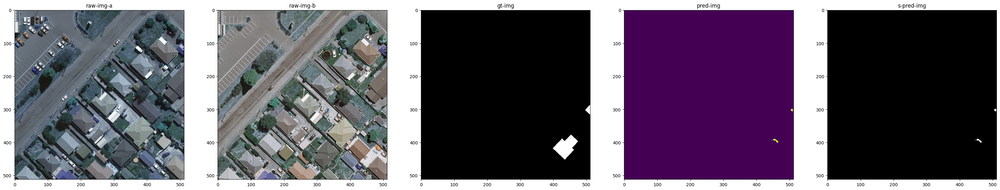

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.29it/s]

2023-10-09 02:16:54 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_22_40.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.15it/s]


[0]
(512, 512, 3)


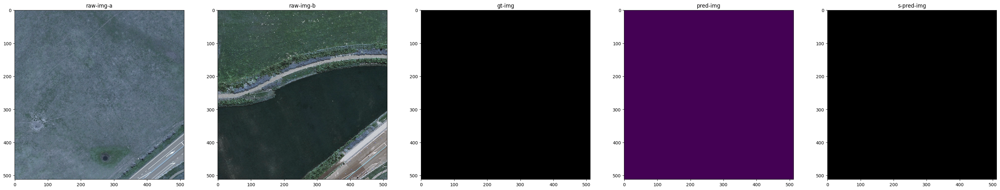

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.35it/s]

2023-10-09 02:16:55 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_22_16.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.11it/s]


[0 1]
(512, 512, 3)


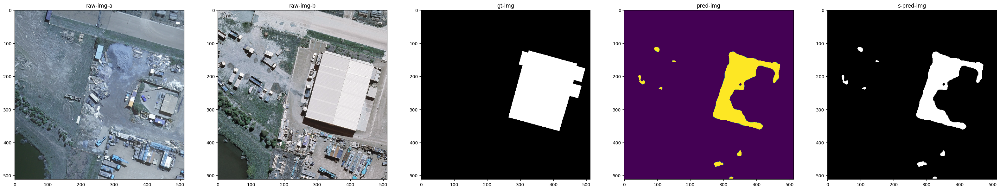

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  8.93it/s]

2023-10-09 02:16:57 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_6_18.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  8.59it/s]


[0]
(512, 512, 3)


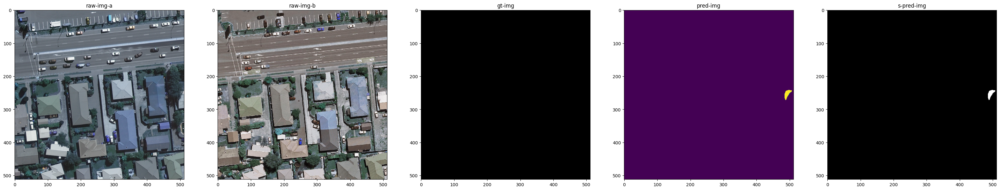

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.13it/s]

2023-10-09 02:16:59 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_17_45.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  9.91it/s]


[0 1]
(512, 512, 3)


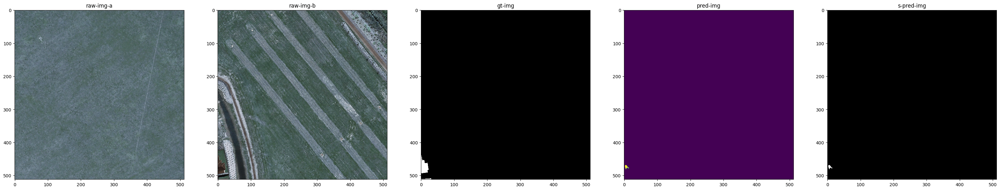

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.22it/s]

2023-10-09 02:17:00 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_24_44.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.00it/s]


[0]
(512, 512, 3)


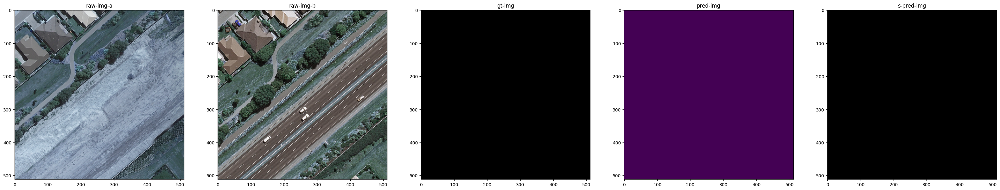

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.10it/s]

2023-10-09 02:17:02 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_27_46.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  9.98it/s]


[0 1]
(512, 512, 3)


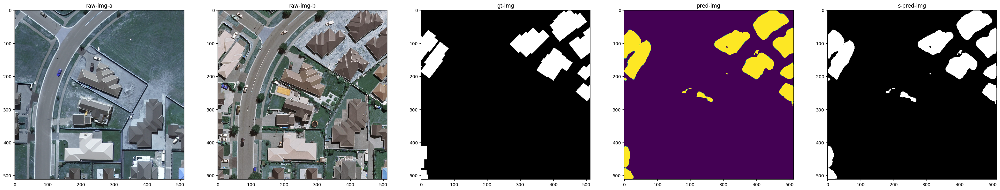

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.24it/s]

2023-10-09 02:17:04 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_2_22.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.09it/s]


[0 1]
(512, 512, 3)


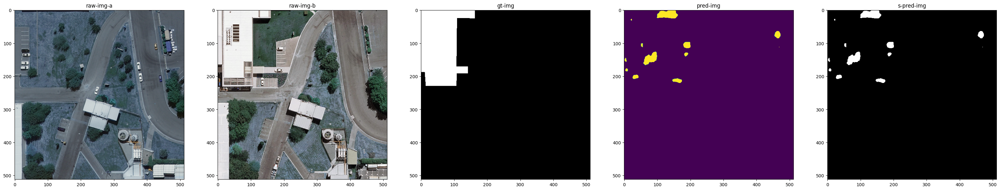

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.09it/s]

2023-10-09 02:17:05 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_11_38.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  9.93it/s]


[0]
(512, 512, 3)


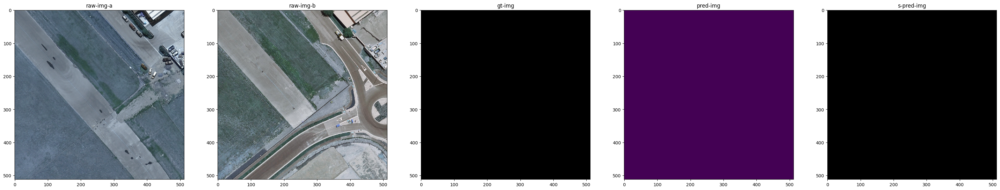

4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00, 10.15it/s]

2023-10-09 02:17:07 [INFO]	GeoTiff file saved in /home/zju/data_szw/paddlers/data/WHU-BCD/infer/whubcd_1_7.tif.


4 out of 4 blocks processed.: 100%|██████████| 4/4 [00:00<00:00,  9.99it/s]


[0 1]
(512, 512, 3)


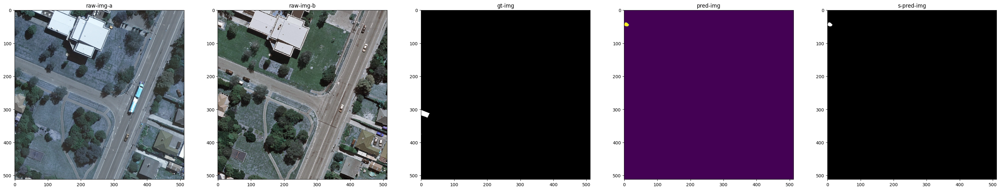

In [5]:
import cv2,os,random
import matplotlib.pyplot as plt
from paddlers.tasks.utils.visualize import visualize_segmentation
from paddlers import transforms as T
import os.path as osp
import paddlers as pdrs
import numpy as np
# from paddlers.utils.postprocs import building_regularization,prepro_mask
%matplotlib inline


# TEST_FILE_LIST_PATH = '/home/zju/data_szw/dataset/levir-cd/test/'
# GT_FILE_LIST_PATH = '/home/zju/data_szw/dataset/levir-cd/test/label/'

TEST_FILE_LIST_PATH = '/home/zju/data_szw/paddlers/data/WHU-BCD/val/'
GT_FILE_LIST_PATH = '/home/zju/data_szw/paddlers/data/WHU-BCD/val/label/'
SAVE_FILE_PATH = '/home/zju/data_szw/paddlers/data/WHU-BCD/infer/'
# 影像波段数量
NUM_BANDS = 3

test_transforms = T.Compose([
    T.DecodeImg(),
    T.SelectBand([1,2,3]),
    # T.Resize(target_size=256),
    # 验证阶段与训练阶段的数据归一化方式必须相同
    T.Normalize(
        mean=[0.5] * NUM_BANDS, std=[0.5] * NUM_BANDS),
    T.ArrangeChangeDetector('test')
])

model = pdrs.tasks.load_model('/home/zju/data_szw/paddlers/output/cd/bit_whubcd/best_model/')

image_list = [e for e in os.listdir(osp.join(TEST_FILE_LIST_PATH,'A')) if e.endswith('.tif')]
total_number = len(image_list)
random.shuffle(image_list)

val_images = image_list[0:10]


for val_image in val_images:
    
    raw_img_a = cv2.imread(osp.join(TEST_FILE_LIST_PATH,'A',val_image))
    raw_img_b = cv2.imread(osp.join(TEST_FILE_LIST_PATH,'B',val_image))
    gt_img = cv2.imread(osp.join(GT_FILE_LIST_PATH,val_image))
    pred_img = model.predict((osp.join(TEST_FILE_LIST_PATH,'A',val_image),osp.join(TEST_FILE_LIST_PATH,'B',val_image)),test_transforms)['label_map']
    model.slider_predict(img_files=(osp.join(TEST_FILE_LIST_PATH,'A',val_image),osp.join(TEST_FILE_LIST_PATH,'B',val_image)),save_dir=SAVE_FILE_PATH,block_size=512, overlap=36,transforms=test_transforms)
    s_pred_img = cv2.imread(osp.join(SAVE_FILE_PATH,val_image.split('.')[0]+'.tif'))
    # shp_result = val_images.split('.')[0]+'.shp'
    # pred_img = building_regularization(prepro_mask(pred_result)) if np.any(pred_result) else pred_result

    # cv2.imwrite(osp.join(SAVE_FILE__PATH,val_images.split('.')[0]+'_reg.tif'),pred_img)
    mat = np.array(gt_img)
    print(np.unique(mat))
    print(gt_img.shape)

    plt.figure(figsize=(40, 8))
    plt.axis('off')
    plt.subplot(1,5,1)
    plt.title('raw-img-a')
    plt.imshow(raw_img_a)

    plt.subplot(1,5,2)
    plt.title('raw-img-b')
    plt.imshow(raw_img_b)

    plt.subplot(1,5,3)
    plt.title('gt-img')
    plt.imshow(gt_img*255)

    plt.subplot(1,5,4)
    plt.title('pred-img')
    plt.imshow(pred_img*255)

    plt.subplot(1,5,5)
    plt.title('s-pred-img')
    plt.imshow(s_pred_img*255)


    plt.show()




